<a href="https://colab.research.google.com/github/EugenHotaj/pytorch-generative/blob/master/notebooks/style_transfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install kornia
!git clone https://www.github.com/EugenHotaj/pytorch-generative pytorch_generative_all 
!mv pytorch_generative_all/pytorch_generative pytorch_generative

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 628.1/628.1 kB 6.2 MB/s eta 0:00:00
Cloning into 'pytorch_generative_all'...
remote: Enumerating objects: 1544, done.
remote: Counting objects: 100% (422/422), done.
remote: Compressing objects: 100% (201/201), done.
remote: Total 1544 (delta 317), reused 285 (delta 216), pack-reused 1122
Receiving objects: 100% (1544/1544), 45.50 MiB | 12.78 MiB/s, done.
Resolving deltas: 100% (1051/1051), done.


In [2]:
import copy
import kornia
from pytorch_generative import colab_utils
import torch
from torch import nn
from torch import optim
from torch.nn import functional as F
from torchvision import models
import torchvision.transforms as transforms
from google.colab import files
print(colab_utils.get_device())

cuda


In [3]:
print("Upload content image")
files.upload_file(filename="content.jpg")

Upload content image


Saved content1.jpg to /content/content.jpg


In [4]:
print("Upload style image")
files.upload_file(filename="style.jpg")

Upload style image


Saved style.jpg to /content/style.jpg


In [5]:
#fixing the image size of the input images
imsize = 512 if torch.cuda.is_available() else 128

In [6]:
#preprocessing helpers used to get multiple versions of the style image
vf = transforms.RandomVerticalFlip(1)
hf = transforms.RandomHorizontalFlip(1)
rc = transforms.RandomResizedCrop(size=imsize,scale=(0.2,0.6),ratio=(1,1))
gs = transforms.Grayscale(3)

/usr/local/lib/python3.9/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


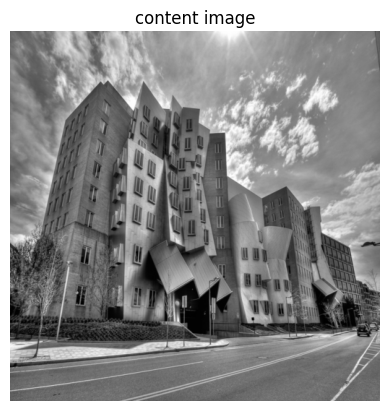

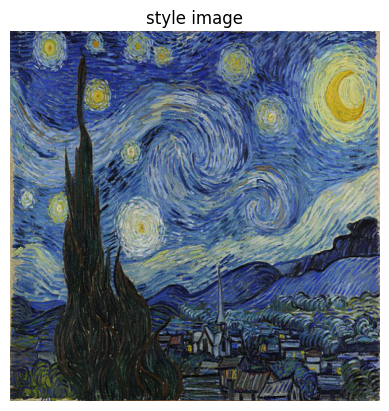

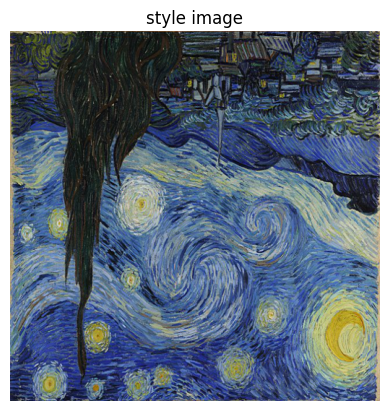

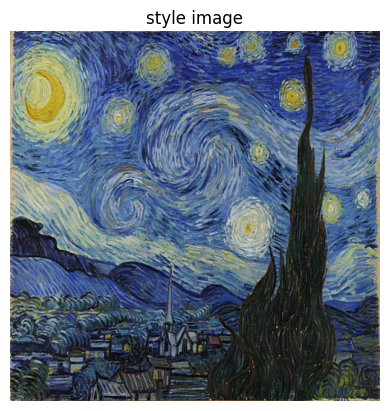

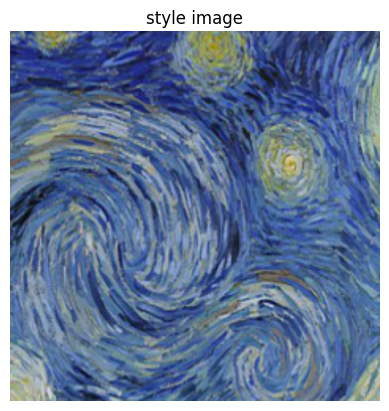

In [7]:
#loading the images as tensors and preprocessing the images
si = colab_utils.load_image("/content/style.jpg", size=imsize)
#content inage is taken in grayscale so that the colours of the original image does not interfere the final image
content_img =  gs(colab_utils.load_image("/content/content.jpg", size=imsize))
#all the preprocessed style images are then stored in a list
#style loss is calculated by adding loss of each image
style_imgs = [si, vf(si), hf(si), rc(si)]
colab_utils.imshow(content_img, title="content image")
for style_img in style_imgs:
  colab_utils.imshow(style_img, title="style image")

In [8]:
class ImageNetNormalize(nn.Module):
  def __init__(self):
    super().__init__()
    mean = torch.tensor((0.485, 0.456, 0.406)).view(1, 3, 1, 1)
    std = torch.tensor((0.229, 0.224, 0.225)).view(1, 3, 1, 1)
    self.register_buffer('_mean', mean)
    self.register_buffer('_std', std)

  def forward(self, input):
    return (input - self._mean.to(input.device)) / self._std.to(input.device)

class ContentLoss(nn.Module):
#this module is used to compute l1 loss with respect to the target
  def __init__(self, target):
    #this initializes a new contentloss instance
    super().__init__()
    self._target = target.detach()
    self.loss = None

  def forward(self, input):
    self.loss = F.l1_loss(input, self._target)
    return input


class StyleLoss(nn.Module):
  #this module is used for style loss as above
  def __init__(self, target_feature):
    super().__init__()
    # Detach target since we do not want to use it for gradient computation.
    self._target = self._gram_matrix(target_feature.detach()).detach()
    self.loss = None

  def _gram_matrix(self, input):
    n, c, w, h = input.size()
    features = input.view(n * c, w * h)
    G = torch.mm(features, features.t())
    return G.div(n * c * w * h)

  def forward(self, input):
    G = self._gram_matrix(input)
    self.loss = F.l1_loss(G, self._target)
    return input


def get_nst_model_and_losses(
    model,  content_img,  style_imgs, content_layers, style_layers):
  #here we are parsing the retrained model and adding the contentloss and style modules after the layers that we use as content layers and style layers
  nst_model = nn.Sequential(ImageNetNormalize())
  content_losses, style_losses, last_layer = [], [], 0
  for i, (name, layer) in enumerate(copy.deepcopy(model).named_children()):
    nst_model.add_module(name, layer)
    if name in content_layers:
      content_loss = ContentLoss(nst_model(content_img))
      nst_model.add_module(f'{name}_ContentLoss', content_loss)
      content_losses.append(content_loss)
      last_layer = i
    if name in style_layers:
      for j, style_img in enumerate(style_imgs):
        style_loss = StyleLoss(nst_model(style_img))
        nst_model.add_module(f'{name}_StyleLoss_{j}', style_loss)
        style_losses.append(style_loss)
        last_layer = i + j
  #checking that we have the desired number of style and content layers.
  assert len(content_losses) == len(content_layers), 'Not all content layers found.'
  assert len(style_losses) / len(style_imgs) == len(style_layers), 'Not all style layers found.'
#removing the layers after the last styleloss layer and the last content loss layer since we are not taking them into account
  last_layer += 1 + len(content_losses) + len(style_losses)
  nst_model = nst_model[:last_layer+1]
  return nst_model, content_losses, style_losses 

In [9]:
#for simplecity we are renaming the layers that we want as content layers and style layers
def rename_vgg_layers(model):
  block, number = 1, 1
  renamed = nn.Sequential()
  for layer in model.children():
    if isinstance(layer, nn.Conv2d):
      name = f'conv{block}_{number}'
    elif isinstance(layer, nn.ReLU):
      name = f'relu{block}_{number}'
      # The inplace ReLU version doesn't play nicely with NST.
      layer = nn.ReLU(inplace=False)
      number += 1
    elif isinstance(layer, nn.MaxPool2d):
      name = f'pool_{block}'
      # Average pooling was found to generate images of higher quality than
      # max pooling by Gatys et al.
      layer = nn.AvgPool2d(layer.kernel_size, layer.stride)
      block += 1
      number = 1
    else:
      raise RuntimeError(f'Unrecognized layer "{layer.__class__.__name__}""') 
    renamed.add_module(name, layer)
  return renamed

In [10]:
#loading the pretrained model and renaming the layers
model = models.vgg19(pretrained=True).features.eval()
model = rename_vgg_layers(model)
print(model)

/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:06<00:00, 86.0MB/s]


Sequential(
  (conv1_1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu1_1): ReLU()
  (conv1_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu1_2): ReLU()
  (pool_1): AvgPool2d(kernel_size=2, stride=2, padding=0)
  (conv2_1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu2_1): ReLU()
  (conv2_2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu2_2): ReLU()
  (pool_2): AvgPool2d(kernel_size=2, stride=2, padding=0)
  (conv3_1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu3_1): ReLU()
  (conv3_2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu3_2): ReLU()
  (conv3_3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu3_3): ReLU()
  (conv3_4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu3_4): ReLU()
  (pool_3): AvgPool2d(kernel_size=2, stride=2, padding=0)
  (conv4_1):

In [11]:
def run_style_transfer(
    model, 
    content_img, 
    style_imgs, 
    content_layers,
    style_layers,
    input_img=None, 
    num_steps=2000, 
    content_weight=1., 
    style_weight=180,
    log_steps=250):
  #here wew are calculating the loss and improving the final combined image
  #if the initial image is none then we initialize it with gausian noise
  device = colab_utils.get_device()
  model = model.to(device)
  content_img = content_img.unsqueeze(0).to(device)
  style_imgs = [style_img.unsqueeze(0).to(device) for style_img in style_imgs]
  n, c, h, w = content_img.data.size()
  if h != w:
    print(f"WARNING: Non-square images may require re-tuning hyperparameters.")
  if input_img is None:
    input_img = torch.randn((n, c, h, w), device=device)
    input_img = input_img * .01  # Scale the noise variance down.
    
  model, content_losses, style_losses = get_nst_model_and_losses(
      model, content_img, style_imgs, content_layers, style_layers)
  model = model.to(device) 
  optimizer = optim.Adam([input_img.requires_grad_()], lr=.05)
  transform = nn.Sequential(
    kornia.augmentation.RandomResizedCrop(
        size=(h, w), scale=(.97, 1.), ratio=(.97, 1.03)),
    kornia.augmentation.RandomRotation(degrees=1.))
  for step in range(num_steps):
    optimizer.zero_grad()
    input_img.data.clamp_(0, 1)
    if h == w:
      model(transform(input_img))
    else:
      model(input_img)
    content_loss, style_loss = 0, 0
    for cl in content_losses:
      content_loss += content_weight * cl.loss
    for sl in style_losses:
      style_loss += style_weight * sl.loss
    loss = content_loss + style_loss 
    loss.backward()
    optimizer.step()
    
    if (step > 0 and step % log_steps == 0) or (step + 1) == num_steps:
      print(f'[{step}]:content_loss={content_loss.item()},'
            f' style_loss={style_loss.item():4f}')
      if(abs(content_loss.item()-style_loss.item())>0.12):
        if(style_loss>content_loss):
          style_weight-=10
        else:
          style_weight+=10
        print(f'new style weight is {style_weight}')
      colab_utils.imshow(input_img.data.clamp_(0, 1), figsize=(10, 10))
  return input_img

[250]:content_loss=0.5844751596450806, style_loss=1.139934
new style weight is 170.0
[500]:content_loss=0.5334463119506836, style_loss=1.179157
new style weight is 160.0
[750]:content_loss=0.5265145301818848, style_loss=1.013170
new style weight is 150.0
[1000]:content_loss=0.5018050670623779, style_loss=1.045625
new style weight is 140.0
[1250]:content_loss=0.5825973749160767, style_loss=0.935863
new style weight is 130.0
[1500]:content_loss=0.5549546480178833, style_loss=0.745863
new style weight is 120.0
[1750]:content_loss=0.4811062216758728, style_loss=0.663755
new style weight is 110.0
[1999]:content_loss=0.5429180860519409, style_loss=0.741248
new style weight is 100.0


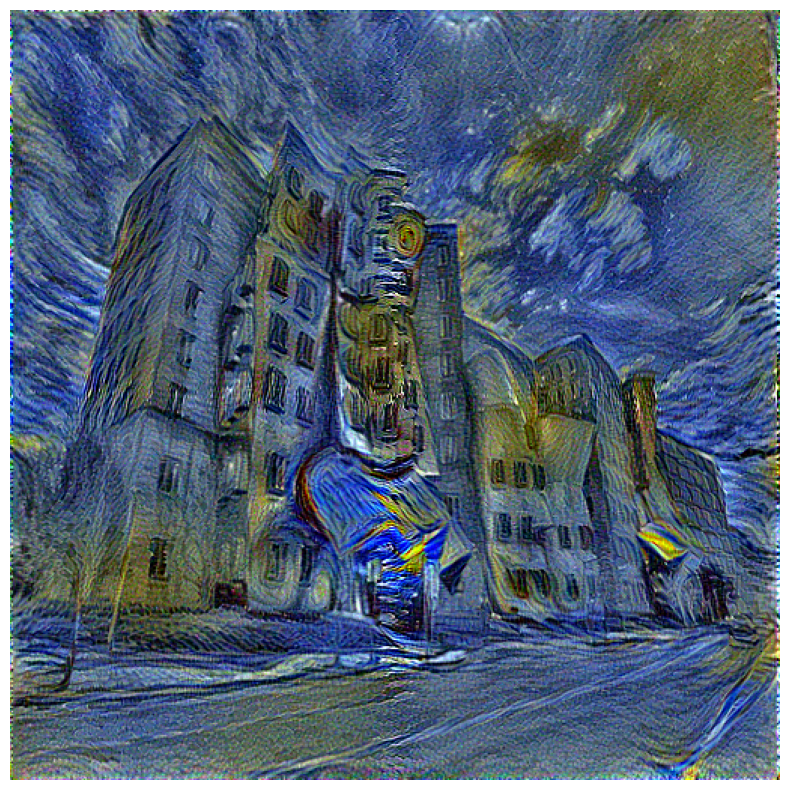

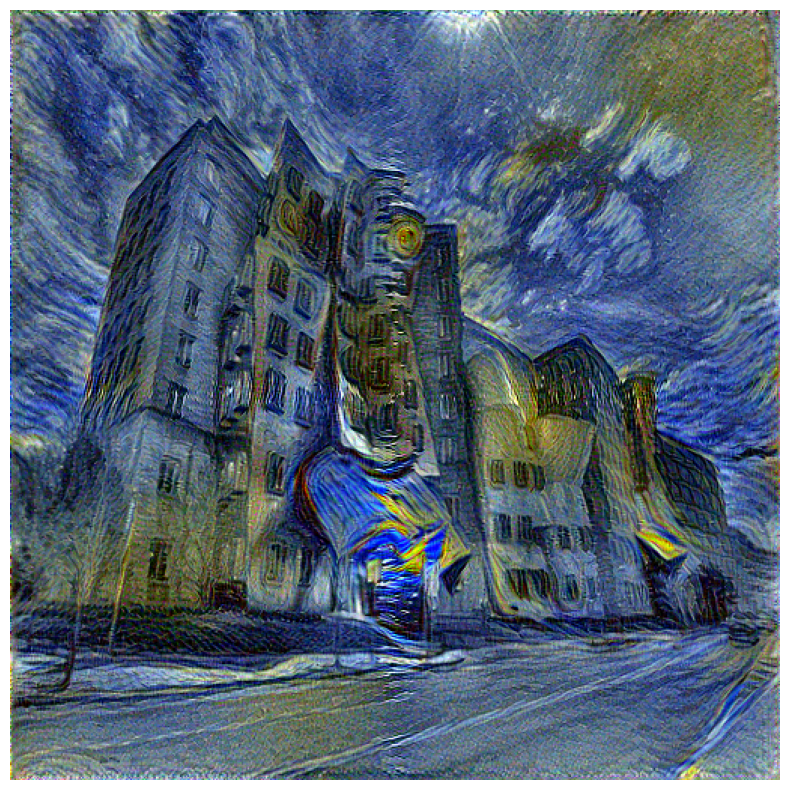

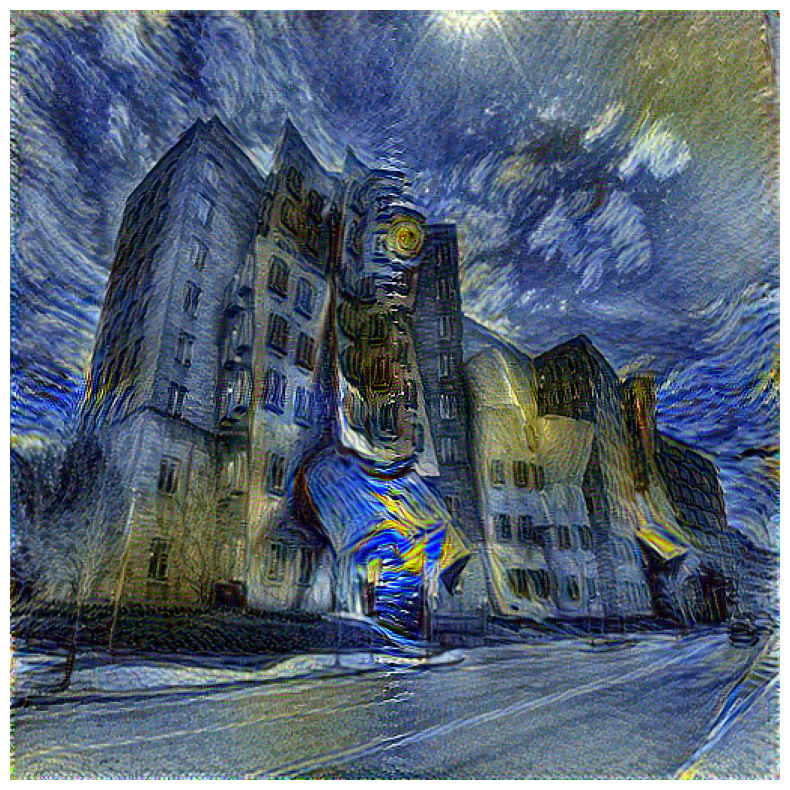

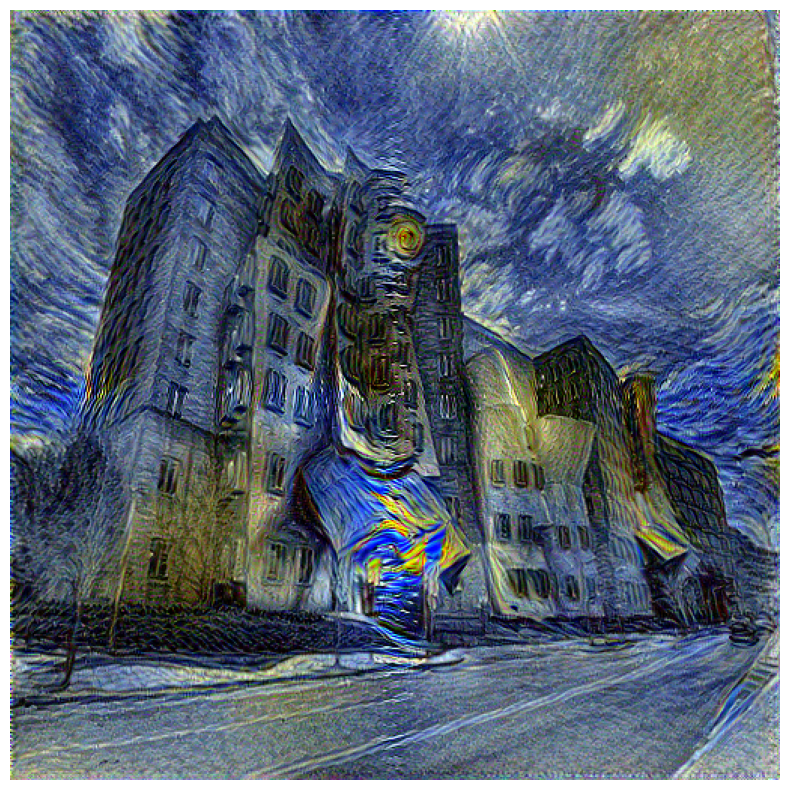

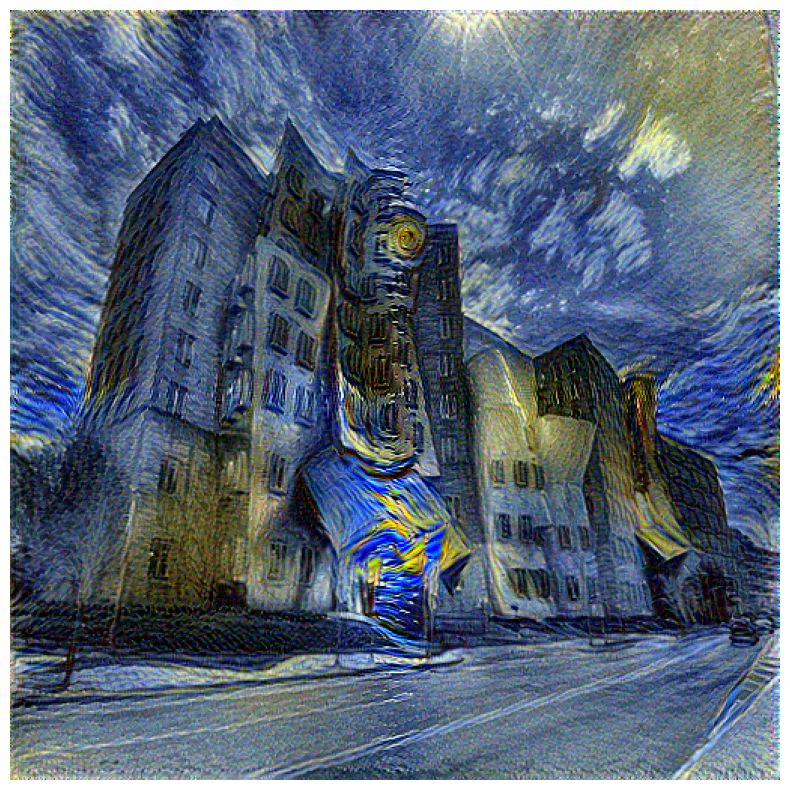

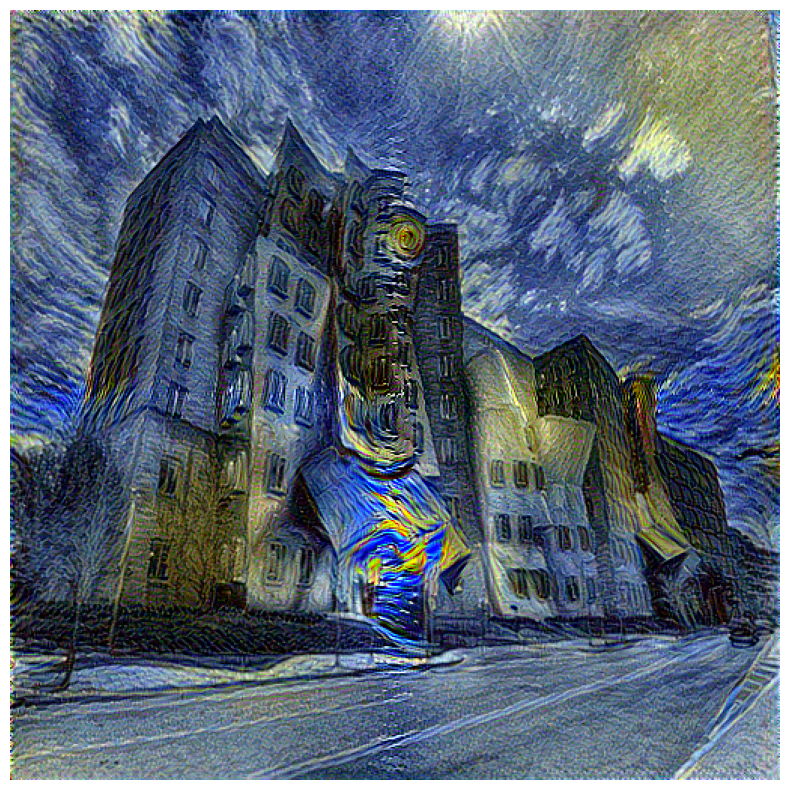

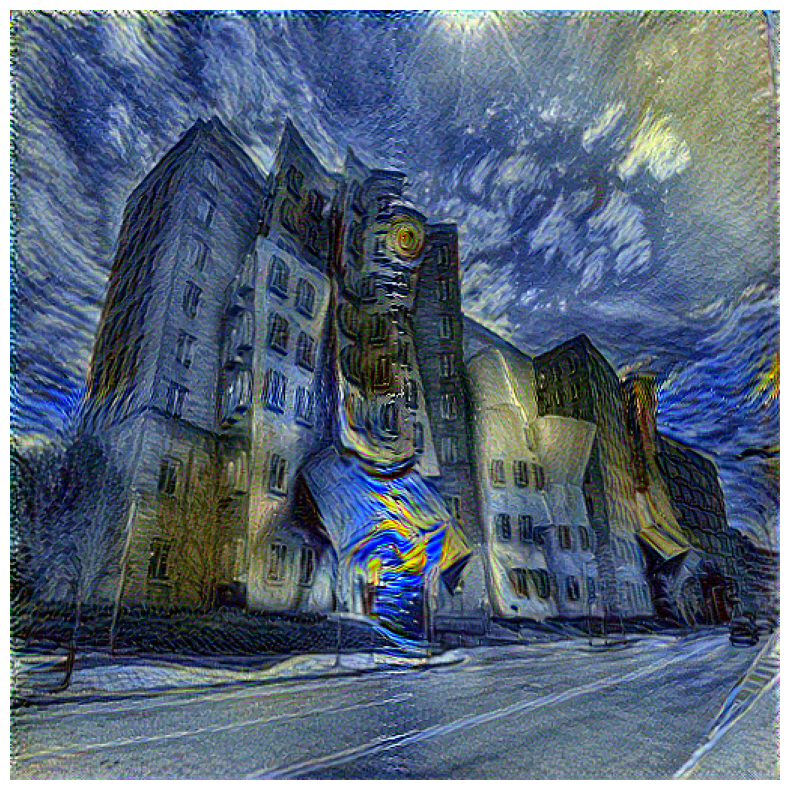

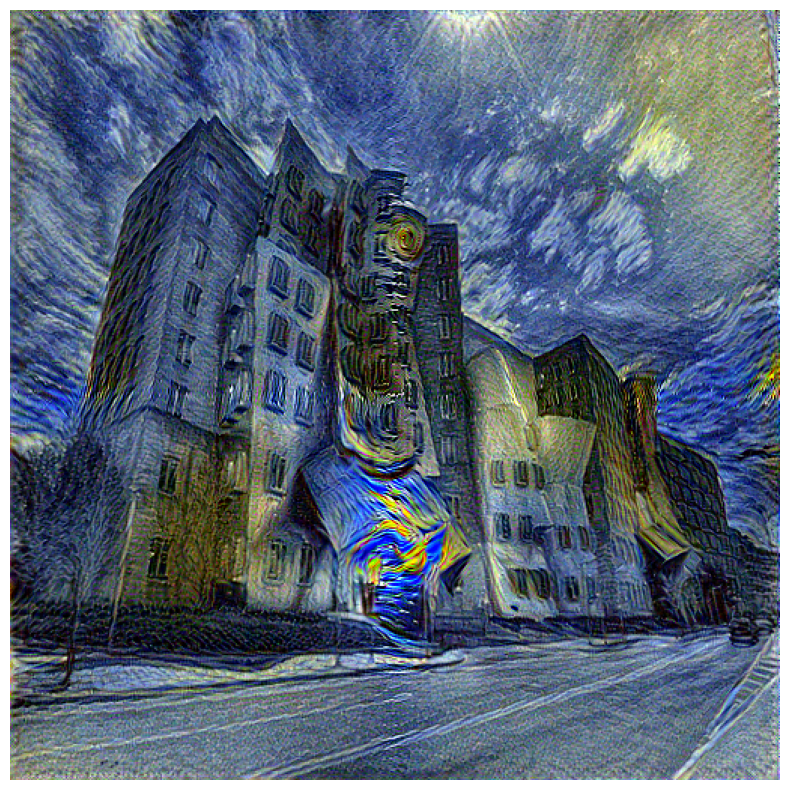

In [12]:
#here we are defining the layers that we use for computing the content and style loss
#after running the model with zero weighted style loss, one can observe that the content of the image gets lost as we move deeper towards the inner layers
#whereas for the style image the inner layers depict the artystic style of the artist
#we take 5 layers which acts as the so called representative of the layers
vgg_default_content_layers = ['relu3_2']
vgg_default_style_layers = [
  'relu1_1', 'relu2_1', 'relu3_1', 'relu4_1', 'relu5_1']

input_img = None
#i set the values that work best on maximum number of the images
#the weights are changed based in the losses during the iteration
output = run_style_transfer(
    model=model, 
    content_img=content_img, 
    style_imgs=style_imgs,
    content_layers=vgg_default_content_layers,
    style_layers=vgg_default_style_layers,
    num_steps=2000,
    content_weight=1.,
    style_weight=180.,
    log_steps=250)